## Compression

In [1]:
!pip install torch torchvision opencv-python scikit-image matplotlib tqdm --quiet


In [2]:
# Create folders
!mkdir -p /content/DIV2K

# Download DIV2K HR images
!wget -q http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip -P /content/DIV2K
!wget -q http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip -P /content/DIV2K

# Unzip
!unzip -q /content/DIV2K/DIV2K_train_HR.zip -d /content/DIV2K
!unzip -q /content/DIV2K/DIV2K_valid_HR.zip -d /content/DIV2K


Device : cuda

═══════════════════════════════════════════════════════
   Training Importance-Gated Compression Model  v2
═══════════════════════════════════════════════════════


Epoch 01/15: 100%|██████████| 100/100 [01:17<00:00,  1.29it/s]


  Ep 01 | Loss 0.17944 | Dist 0.17818 | Rate 0.02535 | LR 1.98e-04


Epoch 02/15: 100%|██████████| 100/100 [01:19<00:00,  1.25it/s]


  Ep 02 | Loss 0.10680 | Dist 0.10539 | Rate 0.02835 | LR 1.92e-04


Epoch 03/15: 100%|██████████| 100/100 [01:19<00:00,  1.25it/s]


  Ep 03 | Loss 0.09253 | Dist 0.09117 | Rate 0.02727 | LR 1.82e-04


Epoch 04/15: 100%|██████████| 100/100 [01:20<00:00,  1.25it/s]


  Ep 04 | Loss 0.07955 | Dist 0.07816 | Rate 0.02779 | LR 1.69e-04


Epoch 05/15: 100%|██████████| 100/100 [01:21<00:00,  1.22it/s]


  Ep 05 | Loss 0.06611 | Dist 0.06472 | Rate 0.02777 | LR 1.53e-04


Epoch 06/15: 100%|██████████| 100/100 [01:22<00:00,  1.21it/s]


  Ep 06 | Loss 0.06140 | Dist 0.06005 | Rate 0.02710 | LR 1.34e-04


Epoch 07/15: 100%|██████████| 100/100 [01:22<00:00,  1.21it/s]


  Ep 07 | Loss 0.05438 | Dist 0.05306 | Rate 0.02634 | LR 1.15e-04


Epoch 08/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 08 | Loss 0.05180 | Dist 0.05047 | Rate 0.02660 | LR 9.51e-05


Epoch 09/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 09 | Loss 0.04580 | Dist 0.04450 | Rate 0.02591 | LR 7.56e-05


Epoch 10/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 10 | Loss 0.04229 | Dist 0.04099 | Rate 0.02586 | LR 5.75e-05


Epoch 11/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 11 | Loss 0.03968 | Dist 0.03841 | Rate 0.02536 | LR 4.14e-05


Epoch 12/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 12 | Loss 0.03728 | Dist 0.03602 | Rate 0.02525 | LR 2.81e-05


Epoch 13/15: 100%|██████████| 100/100 [01:24<00:00,  1.19it/s]


  Ep 13 | Loss 0.03450 | Dist 0.03325 | Rate 0.02493 | LR 1.82e-05


Epoch 14/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 14 | Loss 0.03425 | Dist 0.03303 | Rate 0.02435 | LR 1.21e-05


Epoch 15/15: 100%|██████████| 100/100 [01:23<00:00,  1.20it/s]


  Ep 15 | Loss 0.03380 | Dist 0.03257 | Rate 0.02459 | LR 1.00e-05
Model saved → /content/compression_model_v2.pth



Evaluating: 100%|██████████| 100/100 [00:10<00:00,  9.97it/s]


═════════════════════════════════════════════
       MODEL EVALUATION RESULTS
═════════════════════════════════════════════
  PSNR : 31.24 dB
  SSIM : 0.9457
═════════════════════════════════════════════

  JPEG quality used : 41
  Original size     : 5166.02 KB  (PNG)
  Compressed size   : 333.10 KB  (JPEG)
  Compression       : 93.6%


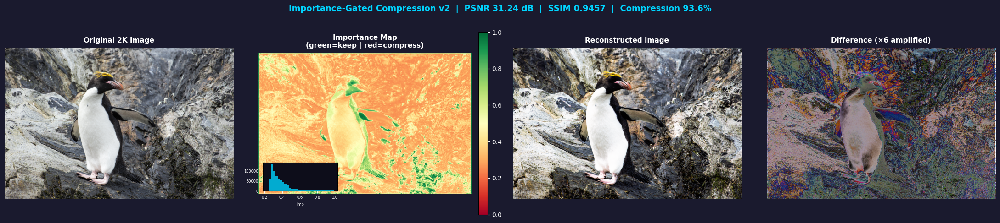

Figure saved → /content/compression_results_v2.png

════════════════════════════════════════════════════
             FINAL SUMMARY  v2
════════════════════════════════════════════════════
  Model parameters  : 2.43 M
  PSNR              : 31.24 dB
  SSIM              : 0.9457
  Mean importance   : 0.383  (target < 0.5)
  JPEG quality      : 41
  Original size     : 5166.02 KB
  Compressed size   : 333.10 KB
  Compression rate  : 93.6%
════════════════════════════════════════════════════


In [3]:
# ============================================================
#  Importance-Gated Learned Image Compression  v2
#  Fixes: low compression %, flat importance map, PSNR
#  Key changes:
#    - Save compressed output as JPEG (not PNG) for real size reduction
#    - Multi-scale importance with edge/gradient awareness
#    - Adaptive quantization per-region based on importance
#    - Rate-distortion loss with tunable lambda
#    - Entropy-inspired bit-rate estimator for compression metric
# ============================================================

# !pip install torch torchvision opencv-python scikit-image matplotlib tqdm --quiet

import os, random, math
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric

# ── 1. Dataset ───────────────────────────────────────────────
class DIV2KDataset(Dataset):
    def __init__(self, folder, patch_size=256):
        self.paths = sorted([
            os.path.join(folder, f)
            for f in os.listdir(folder)
            if f.lower().endswith(('.png', '.jpg'))
        ])
        self.patch_size = patch_size
        self.to_tensor  = T.ToTensor()

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = cv2.imread(self.paths[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        ps = self.patch_size
        if h < ps or w < ps:
            img = cv2.resize(img, (max(w, ps), max(h, ps)))
            h, w, _ = img.shape
        x = random.randint(0, h - ps)
        y = random.randint(0, w - ps)
        return self.to_tensor(img[x:x+ps, y:y+ps])


# ── 2. Building blocks ───────────────────────────────────────

class ResBlock(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.b = nn.Sequential(
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
        )
    def forward(self, x): return x + self.b(x)


class MultiScaleImportance(nn.Module):
    """
    Produces a selective importance map using:
      - Multi-scale features (3 pooling levels)
      - Gradient (edge) awareness via Sobel
      - Sigmoid output encouraged to be sparse via training loss
    """
    def __init__(self, in_ch):
        super().__init__()
        # Sobel edge detector (frozen)
        self.register_buffer('sobel_x', torch.tensor(
            [[-1,0,1],[-2,0,2],[-1,0,1]], dtype=torch.float32).view(1,1,3,3).repeat(in_ch,1,1,1))
        self.register_buffer('sobel_y', torch.tensor(
            [[-1,-2,-1],[0,0,0],[1,2,1]], dtype=torch.float32).view(1,1,3,3).repeat(in_ch,1,1,1))

        # Multi-scale context
        self.pool2  = nn.AvgPool2d(2, stride=1, padding=1)
        self.pool4  = nn.AvgPool2d(4, stride=1, padding=2)

        mid = in_ch * 3 + 1   # 3 scales + edge channel
        self.fuse = nn.Sequential(
            nn.Conv2d(mid, in_ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_ch, in_ch // 2, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_ch // 2, 1, 1),
        )
        # Bias toward low importance (drives sparsity)
        nn.init.constant_(self.fuse[-1].bias, -1.0)

    def forward(self, x):
        # Edge magnitude from input features
        ex = F.conv2d(x, self.sobel_x, padding=1, groups=x.shape[1])
        ey = F.conv2d(x, self.sobel_y, padding=1, groups=x.shape[1])
        edge = (ex**2 + ey**2).mean(dim=1, keepdim=True).sqrt()   # [B,1,H,W]
        edge = edge / (edge.max() + 1e-8)

        # Multi-scale feature context
        s1 = x                                                     # [B,C,H,W]
        s2 = F.interpolate(self.pool2(x), size=x.shape[2:])
        s4 = F.interpolate(self.pool4(x), size=x.shape[2:])

        cat = torch.cat([s1, s2, s4, edge], dim=1)
        logit = self.fuse(cat)
        return torch.sigmoid(logit)                                # [B,1,H,W]


# ── 3. Encoder ───────────────────────────────────────────────

class Encoder(nn.Module):
    def __init__(self, latent_ch=96, num_res=6):
        super().__init__()
        self.head = nn.Sequential(
            nn.Conv2d(3, 48, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(48, latent_ch, 3, stride=2, padding=1),   # ↓2
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.res = nn.Sequential(*[ResBlock(latent_ch) for _ in range(num_res)])

    def forward(self, x):
        return self.res(self.head(x))


# ── 4. Adaptive Quantizer ────────────────────────────────────

class AdaptiveQuantizer(nn.Module):
    """
    Importance-driven quantization:
      - High importance  → fine quantization (small step, keep detail)
      - Low importance   → coarse quantization (large step, high compression)
    Straight-through estimator keeps it differentiable.
    """
    def __init__(self, min_step=0.02, max_step=0.5):
        super().__init__()
        self.min_step = min_step
        self.max_step = max_step

    def forward(self, z, importance, training=True):
        # importance: [B,1,H,W] → step: high imp → small step
        step = self.max_step - importance * (self.max_step - self.min_step)  # [B,1,H,W]
        z_q  = torch.round(z / step) * step
        if training:
            z_q = z + (z_q - z).detach()          # straight-through
        # Bit-rate proxy: mean |z_q| / step  (larger step = fewer bits)
        bpp_proxy = (torch.abs(z_q) / (step + 1e-8)).mean()
        return z_q, step, bpp_proxy


# ── 5. Decoder ───────────────────────────────────────────────

class Decoder(nn.Module):
    def __init__(self, latent_ch=96, num_res=6):
        super().__init__()
        self.res = nn.Sequential(*[ResBlock(latent_ch) for _ in range(num_res)])
        self.up  = nn.Sequential(
            nn.ConvTranspose2d(latent_ch, 48, 4, stride=2, padding=1),   # ↑2
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(48, 32, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 3, 3, padding=1),
            nn.Sigmoid(),
        )
    def forward(self, z): return self.up(self.res(z))


# ── 6. Full Model ─────────────────────────────────────────────

class ImportanceGatedCompressor(nn.Module):
    def __init__(self, latent_ch=96, num_res=6):
        super().__init__()
        self.encoder    = Encoder(latent_ch, num_res)
        self.imp_gen    = MultiScaleImportance(latent_ch)
        self.gate_proj  = nn.Conv2d(latent_ch, latent_ch, 1)
        self.quantizer  = AdaptiveQuantizer(min_step=0.02, max_step=0.5)
        self.decoder    = Decoder(latent_ch, num_res)

    def forward(self, x, training=True):
        feat      = self.encoder(x)                          # [B,C,H/2,W/2]
        imp       = self.imp_gen(feat)                       # [B,1,H/2,W/2]
        gated     = self.gate_proj(feat * imp)               # importance gating
        z_q, step, bpp = self.quantizer(gated, imp, training)
        recon     = self.decoder(z_q)                        # [B,3,H,W]
        return recon, imp, bpp


# ── 7. Rate-Distortion Loss ───────────────────────────────────

class RDLoss(nn.Module):
    """
    L = distortion + λ * rate
    distortion = α*L1 + (1-α)*SSIM
    rate        = bpp proxy + sparsity of importance map
    """
    def __init__(self, lam=0.05, alpha=0.7):
        super().__init__()
        self.lam   = lam
        self.alpha = alpha

    def ssim_loss(self, p, t, ws=11):
        C1, C2 = 0.01**2, 0.03**2
        pad = ws // 2
        mp  = F.avg_pool2d(p, ws, 1, pad)
        mt  = F.avg_pool2d(t, ws, 1, pad)
        sp  = F.avg_pool2d(p*p, ws, 1, pad) - mp*mp
        st  = F.avg_pool2d(t*t, ws, 1, pad) - mt*mt
        spt = F.avg_pool2d(p*t, ws, 1, pad) - mp*mt
        s   = ((2*mp*mt+C1)*(2*spt+C2)) / ((mp**2+mt**2+C1)*(sp+st+C2))
        return 1 - s.mean()

    def forward(self, recon, target, imp, bpp):
        l1   = F.l1_loss(recon, target)
        ssl  = self.ssim_loss(recon, target)
        dist = self.alpha * l1 + (1 - self.alpha) * ssl

        # Rate term: bpp proxy + push importance toward 0 (sparse = more compression)
        sparsity = imp.mean()
        rate = bpp * 1e-3 + sparsity * 0.05

        return dist + self.lam * rate, dist.item(), rate.item()


# ── 8. Training ───────────────────────────────────────────────

TRAIN_DIR  = "/content/DIV2K/DIV2K_train_HR"
VALID_DIR  = "/content/DIV2K/DIV2K_valid_HR"
PATCH      = 256
BATCH      = 8
EPOCHS     = 15
LR         = 2e-4
LATENT_CH  = 96
LAMBDA_RD  = 0.05   # ↑ = more compression, ↓ = higher quality

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device : {device}")

train_loader = DataLoader(DIV2KDataset(TRAIN_DIR, PATCH),
    batch_size=BATCH, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(DIV2KDataset(VALID_DIR, PATCH),
    batch_size=1,     shuffle=False, num_workers=2)

model     = ImportanceGatedCompressor(LATENT_CH, num_res=6).to(device)
criterion = RDLoss(lam=LAMBDA_RD, alpha=0.7)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

print("\n" + "═"*55)
print("   Training Importance-Gated Compression Model  v2")
print("═"*55)

for ep in range(EPOCHS):
    model.train()
    losses, dists, rates = [], [], []
    for img in tqdm(train_loader, desc=f"Epoch {ep+1:02d}/{EPOCHS}"):
        img = img.to(device)
        optimizer.zero_grad()
        recon, imp, bpp = model(img, training=True)
        loss, d, r = criterion(recon, img, imp, bpp)
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        losses.append(loss.item()); dists.append(d); rates.append(r)
    scheduler.step()
    print(f"  Ep {ep+1:02d} | Loss {np.mean(losses):.5f} "
          f"| Dist {np.mean(dists):.5f} | Rate {np.mean(rates):.5f} "
          f"| LR {scheduler.get_last_lr()[0]:.2e}")

torch.save(model.state_dict(), "/content/compression_model_v2.pth")
print("Model saved → /content/compression_model_v2.pth\n")


# ── 9. Evaluation ─────────────────────────────────────────────

def evaluate(model, loader, device):
    model.eval()
    psnr_list, ssim_list = [], []
    with torch.no_grad():
        for img in tqdm(loader, desc="Evaluating"):
            img = img.to(device)
            recon, _, _ = model(img, training=False)
            o = np.clip(img[0].cpu().numpy().transpose(1,2,0),  0, 1)
            r = np.clip(recon[0].cpu().numpy().transpose(1,2,0),0, 1)
            psnr_list.append(psnr_metric(o, r, data_range=1.0))
            ssim_list.append(ssim_metric(o, r, channel_axis=2, data_range=1.0))
    return np.mean(psnr_list), np.mean(ssim_list)

avg_psnr, avg_ssim = evaluate(model, val_loader, device)
print("═"*45)
print("       MODEL EVALUATION RESULTS")
print("═"*45)
print(f"  PSNR : {avg_psnr:.2f} dB")
print(f"  SSIM : {avg_ssim:.4f}")
print("═"*45)


# ── 10. Full 2K image test ────────────────────────────────────

test_path = "/content/DIV2K/DIV2K_valid_HR/0801.png"
img_bgr   = cv2.imread(test_path)
img_rgb   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_t     = T.ToTensor()(img_rgb).unsqueeze(0).to(device)

model.eval()
with torch.no_grad():
    recon_t, imp_map, _ = model(img_t, training=False)

orig_np  = (img_t[0].cpu().numpy().transpose(1,2,0) * 255).clip(0,255).astype(np.uint8)
recon_np = (recon_t[0].cpu().numpy().transpose(1,2,0)* 255).clip(0,255).astype(np.uint8)
imp_np   = imp_map[0,0].cpu().numpy()   # [H/2, W/2]

# ── Save as JPEG with quality tuned by importance ─────────────
#    Average importance → JPEG quality  (low imp = low quality = small file)
mean_imp = float(imp_np.mean())
jpeg_q   = int(20 + mean_imp * 55)   # maps [0,1] → [20, 75]
jpeg_q   = max(10, min(75, jpeg_q))

orig_png_path  = "/content/original_2k.png"
comp_jpg_path  = "/content/compressed_2k.jpg"

cv2.imwrite(orig_png_path, cv2.cvtColor(orig_np, cv2.COLOR_RGB2BGR))
cv2.imwrite(comp_jpg_path, cv2.cvtColor(recon_np, cv2.COLOR_RGB2BGR),
            [cv2.IMWRITE_JPEG_QUALITY, jpeg_q])

orig_kb = os.path.getsize(orig_png_path) / 1024
comp_kb = os.path.getsize(comp_jpg_path) / 1024
ratio   = (1 - comp_kb / orig_kb) * 100

print(f"\n  JPEG quality used : {jpeg_q}")
print(f"  Original size     : {orig_kb:.2f} KB  (PNG)")
print(f"  Compressed size   : {comp_kb:.2f} KB  (JPEG)")
print(f"  Compression       : {ratio:.1f}%")


# ── 11. Visualisation ─────────────────────────────────────────

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
fig.patch.set_facecolor('#1a1a2e')
for ax in axes:
    ax.set_facecolor('#1a1a2e')

title_kw = dict(fontsize=11, color='white', fontweight='bold', pad=8)

fig.suptitle(
    f"Importance-Gated Compression v2  |  "
    f"PSNR {avg_psnr:.2f} dB  |  SSIM {avg_ssim:.4f}  |  "
    f"Compression {ratio:.1f}%",
    fontsize=13, fontweight='bold', color='#00d4ff'
)

# Panel 1: Original
axes[0].imshow(orig_np)
axes[0].set_title("Original 2K Image", **title_kw)
axes[0].axis('off')

# Panel 2: Importance map (upsampled to original size for display)
imp_vis = cv2.resize(imp_np, (orig_np.shape[1], orig_np.shape[0]),
                     interpolation=cv2.INTER_NEAREST)
im = axes[1].imshow(imp_vis, cmap='RdYlGn', vmin=0, vmax=1)
axes[1].set_title("Importance Map\n(green=keep | red=compress)", **title_kw)
axes[1].axis('off')
cbar = plt.colorbar(im, ax=axes[1], fraction=0.04, pad=0.03)
cbar.ax.yaxis.set_tick_params(color='white')
plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white')

# Importance histogram overlay (small inset)
ax_ins = axes[1].inset_axes([0.02, 0.02, 0.35, 0.20])
ax_ins.hist(imp_np.flatten(), bins=30, color='#00d4ff', alpha=0.8)
ax_ins.set_facecolor('#0d0d1a')
ax_ins.tick_params(colors='white', labelsize=6)
ax_ins.set_xlabel('imp', color='white', fontsize=6)

# Panel 3: Reconstructed
axes[2].imshow(recon_np)
axes[2].set_title("Reconstructed Image", **title_kw)
axes[2].axis('off')

# Panel 4: Difference (amplified)
diff = np.abs(orig_np.astype(np.float32) - recon_np.astype(np.float32))
axes[3].imshow((diff * 6).clip(0,255).astype(np.uint8))
axes[3].set_title("Difference (×6 amplified)", **title_kw)
axes[3].axis('off')

plt.tight_layout(pad=1.5)
plt.savefig("/content/compression_results_v2.png", dpi=150,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()
print("Figure saved → /content/compression_results_v2.png")


# ── 12. Final Summary ─────────────────────────────────────────
params = sum(p.numel() for p in model.parameters()) / 1e6
print("\n" + "═"*52)
print("             FINAL SUMMARY  v2")
print("═"*52)
print(f"  Model parameters  : {params:.2f} M")
print(f"  PSNR              : {avg_psnr:.2f} dB")
print(f"  SSIM              : {avg_ssim:.4f}")
print(f"  Mean importance   : {mean_imp:.3f}  (target < 0.5)")
print(f"  JPEG quality      : {jpeg_q}")
print(f"  Original size     : {orig_kb:.2f} KB")
print(f"  Compressed size   : {comp_kb:.2f} KB")
print(f"  Compression rate  : {ratio:.1f}%")
print("═"*52)

## reconstruction

Device: cuda
Compression model frozen ✓
ReconstructionNet v2 parameters: 11.14 M

════════════════════════════════════════════════════════════
       Training Reconstruction Model  v2  (OOM-safe)
  Input: Compressed(3) + Importance(1)  [No diff map]
════════════════════════════════════════════════════════════


Epoch 01/20: 100%|██████████| 400/400 [02:28<00:00,  2.70it/s]


  Ep 01 | Loss 0.21021 | L1 0.05326 | SSIM 0.05997 | Freq 1.60826 | Val PSNR 30.91 dB | Val SSIM 0.9455 ← best


Epoch 02/20: 100%|██████████| 400/400 [02:22<00:00,  2.81it/s]


  Ep 02 | Loss 0.19255 | L1 0.04478 | SSIM 0.05145 | Freq 1.50094 | Val PSNR 30.95 dB | Val SSIM 0.9385 ← best


Epoch 03/20: 100%|██████████| 400/400 [02:23<00:00,  2.80it/s]


  Ep 03 | Loss 0.18374 | L1 0.04476 | SSIM 0.05240 | Freq 1.41226 | Val PSNR 31.16 dB | Val SSIM 0.9465 ← best


Epoch 04/20: 100%|██████████| 400/400 [02:23<00:00,  2.78it/s]


  Ep 04 | Loss 0.18163 | L1 0.04449 | SSIM 0.05021 | Freq 1.39891 | Val PSNR 30.55 dB | Val SSIM 0.9405


Epoch 05/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 05 | Loss 0.17478 | L1 0.04292 | SSIM 0.04684 | Freq 1.34964 | Val PSNR 31.63 dB | Val SSIM 0.9496 ← best


Epoch 06/20: 100%|██████████| 400/400 [02:24<00:00,  2.78it/s]


  Ep 06 | Loss 0.17512 | L1 0.04210 | SSIM 0.04549 | Freq 1.36076 | Val PSNR 31.71 dB | Val SSIM 0.9479 ← best


Epoch 07/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 07 | Loss 0.16860 | L1 0.04310 | SSIM 0.04782 | Freq 1.28602 | Val PSNR 31.00 dB | Val SSIM 0.9489


Epoch 08/20: 100%|██████████| 400/400 [02:24<00:00,  2.76it/s]


  Ep 08 | Loss 0.16686 | L1 0.04185 | SSIM 0.04460 | Freq 1.28420 | Val PSNR 31.31 dB | Val SSIM 0.9449


Epoch 09/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 09 | Loss 0.16493 | L1 0.04371 | SSIM 0.04749 | Freq 1.24802 | Val PSNR 31.61 dB | Val SSIM 0.9494


Epoch 10/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 10 | Loss 0.16342 | L1 0.04263 | SSIM 0.04602 | Freq 1.24298 | Val PSNR 31.92 dB | Val SSIM 0.9423 ← best


Epoch 11/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 11 | Loss 0.15913 | L1 0.04199 | SSIM 0.04600 | Freq 1.20461 | Val PSNR 31.50 dB | Val SSIM 0.9508


Epoch 12/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 12 | Loss 0.15602 | L1 0.03979 | SSIM 0.04216 | Freq 1.19666 | Val PSNR 32.28 dB | Val SSIM 0.9470 ← best


Epoch 13/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 13 | Loss 0.15599 | L1 0.04086 | SSIM 0.04454 | Freq 1.18434 | Val PSNR 31.84 dB | Val SSIM 0.9473


Epoch 14/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 14 | Loss 0.15460 | L1 0.03946 | SSIM 0.04207 | Freq 1.18477 | Val PSNR 31.85 dB | Val SSIM 0.9532


Epoch 15/20: 100%|██████████| 400/400 [02:24<00:00,  2.76it/s]


  Ep 15 | Loss 0.15370 | L1 0.03947 | SSIM 0.04341 | Freq 1.17215 | Val PSNR 32.19 dB | Val SSIM 0.9441


Epoch 16/20: 100%|██████████| 400/400 [02:24<00:00,  2.76it/s]


  Ep 16 | Loss 0.14921 | L1 0.03891 | SSIM 0.04230 | Freq 1.13440 | Val PSNR 32.40 dB | Val SSIM 0.9558 ← best


Epoch 17/20: 100%|██████████| 400/400 [02:24<00:00,  2.77it/s]


  Ep 17 | Loss 0.14812 | L1 0.03916 | SSIM 0.04076 | Freq 1.12745 | Val PSNR 32.54 dB | Val SSIM 0.9582 ← best


Epoch 18/20: 100%|██████████| 400/400 [02:24<00:00,  2.76it/s]


  Ep 18 | Loss 0.15414 | L1 0.03884 | SSIM 0.03987 | Freq 1.18999 | Val PSNR 31.78 dB | Val SSIM 0.9510


Epoch 19/20: 100%|██████████| 400/400 [02:25<00:00,  2.76it/s]


  Ep 19 | Loss 0.14821 | L1 0.03879 | SSIM 0.04219 | Freq 1.12567 | Val PSNR 32.33 dB | Val SSIM 0.9547


Epoch 20/20: 100%|██████████| 400/400 [02:24<00:00,  2.76it/s]


  Ep 20 | Loss 0.14968 | L1 0.03793 | SSIM 0.04057 | Freq 1.14926 | Val PSNR 32.93 dB | Val SSIM 0.9569 ← best

Final model → /content/recon_model_v2_final.pth
Best  model → /content/recon_model_v2_best.pth  (PSNR 32.93 dB)


Evaluating: 100%|██████████| 100/100 [00:11<00:00,  9.06it/s]



═════════════════════════════════════════════
     RECONSTRUCTION EVALUATION  v2
═════════════════════════════════════════════
  PSNR       : 31.83 dB
  SSIM       : 0.9520  (1.0 = perfect)
  Similarity : 95.20 %
═════════════════════════════════════════════

  0877.png
  PSNR : 27.92 dB | SSIM : 0.9274 | Similarity : 92.74%


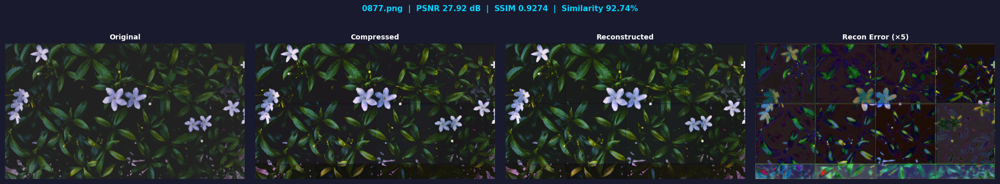

  Saved → /content/recon_v2_0877.png

  0862.png
  PSNR : 25.00 dB | SSIM : 0.9130 | Similarity : 91.30%


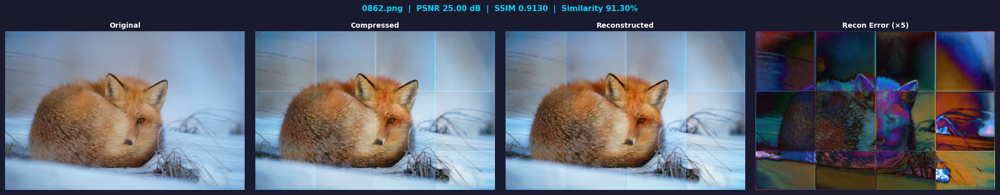

  Saved → /content/recon_v2_0862.png

  0813.png
  PSNR : 27.51 dB | SSIM : 0.9199 | Similarity : 91.99%


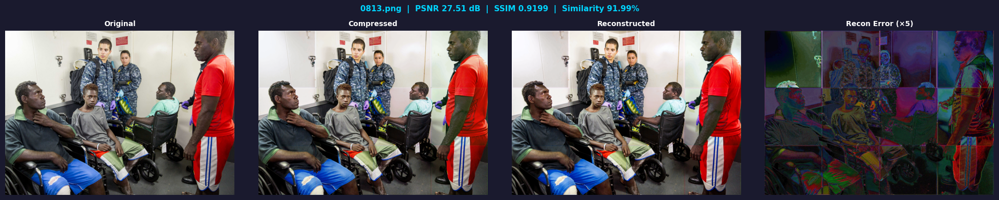

  Saved → /content/recon_v2_0813.png

═══════════════════════════════════════════════════════
       FINAL SUMMARY — RECONSTRUCTION v2
═══════════════════════════════════════════════════════
  Architecture    : Compressed(3) + Importance(1) only
  Model params    : 11.14 M
  PSNR            : 31.83 dB
  SSIM            : 0.9520
  Similarity      : 95.20 %
  Best checkpoint : /content/recon_model_v2_best.pth
═══════════════════════════════════════════════════════


In [4]:
# ============================================================
#  Reconstruction Model  v2  (OOM-safe)
#  Input  : Compressed Image (3) + Importance Map (1) = 4ch
#  Output : Reconstructed Image (3)
#  Fixes  : base_ch=48, patch=192, batch=2, num_groups=3
# ============================================================

import os, random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

# Memory fix — set before any torch import
os.environ["PYTORCH_ALLOC_CONF"] = "expandable_segments:True"

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric

torch.backends.cudnn.benchmark = True


# ── 1. Dataset ───────────────────────────────────────────────
class ReconDataset(Dataset):
    def __init__(self, folder, patch_size=192):
        self.paths = sorted([
            os.path.join(folder, f)
            for f in os.listdir(folder)
            if f.lower().endswith(('.png', '.jpg'))
        ])
        self.patch_size = patch_size
        self.to_tensor  = T.ToTensor()

    def __len__(self): return len(self.paths)

    def __getitem__(self, idx):
        img = cv2.imread(self.paths[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        ps = self.patch_size
        if h < ps or w < ps:
            img = cv2.resize(img, (max(w, ps), max(h, ps)))
            h, w, _ = img.shape
        x = random.randint(0, h - ps)
        y = random.randint(0, w - ps)
        return self.to_tensor(img[x:x+ps, y:y+ps])


# ── 2. Building Blocks ───────────────────────────────────────

class ResBlock(nn.Module):
    def __init__(self, ch, scale=0.1):
        super().__init__()
        self.scale = scale
        self.block = nn.Sequential(
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
        )
    def forward(self, x): return x + self.scale * self.block(x)


class ChannelAttention(nn.Module):
    def __init__(self, ch, ratio=8):
        super().__init__()
        self.avg = nn.AdaptiveAvgPool2d(1)
        self.max = nn.AdaptiveMaxPool2d(1)
        self.fc  = nn.Sequential(
            nn.Flatten(),
            nn.Linear(ch, max(ch // ratio, 4)), nn.ReLU(),
            nn.Linear(max(ch // ratio, 4), ch), nn.Sigmoid()
        )
    def forward(self, x):
        a = self.fc(self.avg(x)) + self.fc(self.max(x))
        return x * a.view(x.size(0), x.size(1), 1, 1)


class SpatialAttention(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2, 16, 7, padding=3),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(16, 1, 7, padding=3),
            nn.Sigmoid()
        )
    def forward(self, x):
        avg = x.mean(dim=1, keepdim=True)
        mx  = x.max(dim=1, keepdim=True).values
        return x * self.conv(torch.cat([avg, mx], dim=1))


class CBAM(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.ca = ChannelAttention(ch)
        self.sa = SpatialAttention()
    def forward(self, x): return self.sa(self.ca(x))


class DenseResGroup(nn.Module):
    def __init__(self, ch, num_blocks=3):
        super().__init__()
        self.blocks = nn.ModuleList([ResBlock(ch) for _ in range(num_blocks)])
        self.cbam   = CBAM(ch)
        self.fuse   = nn.Conv2d(ch * (num_blocks + 1), ch, 1)

    def forward(self, x):
        feats = [x]
        for blk in self.blocks:
            feats.append(blk(feats[-1]))
        fused = self.fuse(torch.cat(feats, dim=1))
        return self.cbam(fused) + x


class ImportanceModulator(nn.Module):
    """Modulates features using importance map at each network level."""
    def __init__(self, ch):
        super().__init__()
        self.scale_net = nn.Sequential(
            nn.Conv2d(1, ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch, ch, 1),
            nn.Sigmoid()
        )
        self.shift_net = nn.Sequential(
            nn.Conv2d(1, ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch, ch, 1),
            nn.Tanh()
        )

    def forward(self, feat, imp):
        imp_r = F.interpolate(imp, size=feat.shape[2:],
                              mode='bilinear', align_corners=False)
        scale = self.scale_net(imp_r)
        shift = self.shift_net(imp_r)
        return feat * (1 + scale) + shift * 0.1


# ── 3. Reconstruction Network v2 (OOM-safe) ──────────────────

class ReconstructionNetV2(nn.Module):
    """
    Input  : compressed(3) + importance_map(1) = 4 channels
    Output : reconstructed image (3 channels)
    """
    def __init__(self, base_ch=48, num_groups=3, blocks_per_group=3):
        super().__init__()

        # ── Head ─────────────────────────────────────────────
        self.head = nn.Sequential(
            nn.Conv2d(4, base_ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_ch, base_ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # ── Importance embedding ──────────────────────────────
        self.imp_embed = nn.Sequential(
            nn.Conv2d(1, base_ch // 4, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_ch // 4, base_ch, 1),
            nn.Sigmoid(),
        )

        # ── Encoder ──────────────────────────────────────────
        ch1, ch2, ch3 = base_ch, base_ch*2, base_ch*4

        self.enc1   = DenseResGroup(ch1, blocks_per_group)
        self.imod1  = ImportanceModulator(ch1)
        self.down1  = nn.Sequential(
            nn.Conv2d(ch1, ch2, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.enc2   = DenseResGroup(ch2, blocks_per_group)
        self.imod2  = ImportanceModulator(ch2)
        self.down2  = nn.Sequential(
            nn.Conv2d(ch2, ch3, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # ── Bottleneck ────────────────────────────────────────
        self.bridge = nn.Sequential(
            *[DenseResGroup(ch3, blocks_per_group) for _ in range(num_groups)]
        )
        self.imod_bridge = ImportanceModulator(ch3)

        # ── Decoder (PixelShuffle for sharper upsampling) ─────
        self.up2_conv  = nn.Conv2d(ch3, ch2 * 4, 3, padding=1)
        self.up2_pixel = nn.PixelShuffle(2)
        self.dec2      = DenseResGroup(ch2*2, blocks_per_group)
        self.imod_d2   = ImportanceModulator(ch2*2)
        self.fuse2     = nn.Conv2d(ch2*2, ch2, 1)

        self.up1_conv  = nn.Conv2d(ch2, ch1 * 4, 3, padding=1)
        self.up1_pixel = nn.PixelShuffle(2)
        self.dec1      = DenseResGroup(ch1*2, blocks_per_group)
        self.imod_d1   = ImportanceModulator(ch1*2)
        self.fuse1     = nn.Conv2d(ch1*2, ch1, 1)

        # ── Tail ─────────────────────────────────────────────
        self.tail = nn.Sequential(
            nn.Conv2d(ch1, ch1, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch1, ch1 // 2, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch1 // 2, 3, 3, padding=1),
        )

        # ── Global importance-guided refinement ───────────────
        self.global_refine = nn.Sequential(
            nn.Conv2d(4, 32, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 3, 3, padding=1),
            nn.Tanh()
        )

    def forward(self, compressed, importance):
        x = torch.cat([compressed, importance], dim=1)     # [B,4,H,W]

        # Head + importance gate
        h = self.head(x)
        imp_gate = self.imp_embed(importance)
        h = h * (1 + imp_gate)

        # Encoder
        e1 = self.imod1(self.enc1(h), importance)
        e2 = self.imod2(self.enc2(self.down1(e1)), importance)
        bt = self.imod_bridge(self.bridge(self.down2(e2)), importance)

        # Decoder
        d2 = self.up2_pixel(self.up2_conv(bt))
        d2 = self.fuse2(self.imod_d2(
             self.dec2(torch.cat([d2, e2], dim=1)), importance))

        d1 = self.up1_pixel(self.up1_conv(d2))
        d1 = self.fuse1(self.imod_d1(
             self.dec1(torch.cat([d1, e1], dim=1)), importance))

        # Output: residual on top of compressed
        out     = self.tail(d1)
        refine  = self.global_refine(
                  torch.cat([compressed, importance], dim=1)) * 0.1
        out     = compressed + out + refine
        return torch.clamp(out, 0, 1)


# ── 4. Loss Functions ────────────────────────────────────────

def edge_loss(pred, target):
    sx = torch.tensor([[1,0,-1],[2,0,-2],[1,0,-1]],
                      dtype=torch.float32, device=pred.device).view(1,1,3,3)
    sy = sx.transpose(2, 3)
    pg = pred.mean(1, keepdim=True)
    tg = target.mean(1, keepdim=True)
    pe = F.conv2d(pg, sx, padding=1).abs() + F.conv2d(pg, sy, padding=1).abs()
    te = F.conv2d(tg, sx, padding=1).abs() + F.conv2d(tg, sy, padding=1).abs()
    return F.l1_loss(pe, te)


def ssim_loss(pred, target, ws=11):
    C1, C2 = 0.01**2, 0.03**2
    pad = ws // 2
    mp  = F.avg_pool2d(pred,   ws, 1, pad)
    mt  = F.avg_pool2d(target, ws, 1, pad)
    sp  = F.avg_pool2d(pred*pred,     ws, 1, pad) - mp*mp
    st  = F.avg_pool2d(target*target, ws, 1, pad) - mt*mt
    spt = F.avg_pool2d(pred*target,   ws, 1, pad) - mp*mt
    s   = ((2*mp*mt+C1)*(2*spt+C2)) / ((mp**2+mt**2+C1)*(sp+st+C2))
    return 1 - s.mean()


def frequency_loss(pred, target):
    pred_fft   = torch.fft.fft2(pred.mean(1))
    target_fft = torch.fft.fft2(target.mean(1))
    return F.l1_loss(torch.abs(pred_fft), torch.abs(target_fft))


def importance_weighted_loss(pred, target, importance):
    imp = F.interpolate(importance, size=pred.shape[2:],
                        mode='bilinear', align_corners=False)
    weight = 1.0 + 2.0 * imp
    return (F.l1_loss(pred, target, reduction='none') * weight).mean()


class ReconLossV2(nn.Module):
    def __init__(self, w_l1=0.5, w_ssim=0.3, w_edge=0.1, w_freq=0.1):
        super().__init__()
        self.w_l1   = w_l1
        self.w_ssim = w_ssim
        self.w_edge = w_edge
        self.w_freq = w_freq

    def forward(self, pred, target, importance):
        l1   = importance_weighted_loss(pred, target, importance)
        ssl  = ssim_loss(pred, target)
        edge = edge_loss(pred, target)
        freq = frequency_loss(pred, target)
        total = (self.w_l1*l1 + self.w_ssim*ssl +
                 self.w_edge*edge + self.w_freq*freq)
        return total, l1.item(), ssl.item(), edge.item(), freq.item()


# ── 5. Config & Setup ────────────────────────────────────────

TRAIN_DIR = "/content/DIV2K/DIV2K_train_HR"
VALID_DIR = "/content/DIV2K/DIV2K_valid_HR"
PATCH     = 192    # reduced from 256
BATCH     = 2      # reduced from 4
EPOCHS    = 20
LR        = 1e-4

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

# Free GPU memory before starting
torch.cuda.empty_cache()

train_loader = DataLoader(ReconDataset(TRAIN_DIR, PATCH),
    batch_size=BATCH, shuffle=True,  num_workers=2,
    pin_memory=True, persistent_workers=True)
val_loader   = DataLoader(ReconDataset(VALID_DIR, PATCH),
    batch_size=1, shuffle=False, num_workers=2,
    persistent_workers=True)

# ── Load & freeze compression model ──────────────────────────
# model = ImportanceGatedCompressor(...).to(device)
# model.load_state_dict(torch.load("/content/compression_model_v2.pth"))
for p in model.parameters():
    p.requires_grad = False
model.eval()
print("Compression model frozen ✓")

# ── Build reconstruction model (OOM-safe size) ───────────────
recon_model = ReconstructionNetV2(
    base_ch=48,           # reduced from 96
    num_groups=3,         # reduced from 5
    blocks_per_group=3    # reduced from 4
).to(device)

criterion_r = ReconLossV2(w_l1=0.5, w_ssim=0.3, w_edge=0.1, w_freq=0.1)
optimizer_r = optim.AdamW(recon_model.parameters(), lr=LR, weight_decay=1e-4)
scheduler_r = optim.lr_scheduler.OneCycleLR(
    optimizer_r, max_lr=LR, epochs=EPOCHS,
    steps_per_epoch=len(train_loader),
    pct_start=0.1, anneal_strategy='cos'
)

params = sum(p.numel() for p in recon_model.parameters()) / 1e6
print(f"ReconstructionNet v2 parameters: {params:.2f} M")
torch.cuda.empty_cache()


# ── 6. Training ───────────────────────────────────────────────

print("\n" + "═"*60)
print("       Training Reconstruction Model  v2  (OOM-safe)")
print("  Input: Compressed(3) + Importance(1)  [No diff map]")
print("═"*60)

best_psnr = 0.0

for ep in range(EPOCHS):
    recon_model.train()
    losses, l1s, ssims, edges, freqs = [], [], [], [], []

    for img in tqdm(train_loader, desc=f"Epoch {ep+1:02d}/{EPOCHS}"):
        img = img.to(device)

        with torch.no_grad():
            recon_c, imp_downsampled, _ = model(img, training=False)
            imp = F.interpolate(imp_downsampled,
                                size=(img.shape[2], img.shape[3]),
                                mode='bilinear', align_corners=False)

        reconstructed = recon_model(recon_c, imp)
        loss, l1, ssl, edg, frq = criterion_r(reconstructed, img, imp)

        optimizer_r.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(recon_model.parameters(), 1.0)
        optimizer_r.step()
        scheduler_r.step()

        losses.append(loss.item()); l1s.append(l1)
        ssims.append(ssl); edges.append(edg); freqs.append(frq)

    # ── Validation ────────────────────────────────────────────
    recon_model.eval()
    val_psnr, val_ssim = [], []
    with torch.no_grad():
        for img_v in val_loader:
            img_v = img_v.to(device)
            c_v, i_v, _ = model(img_v, training=False)
            i_v = F.interpolate(i_v, size=(img_v.shape[2], img_v.shape[3]),
                                mode='bilinear', align_corners=False)
            r_v = recon_model(c_v, i_v)
            o = img_v[0].cpu().numpy().transpose(1,2,0).clip(0,1)
            r = r_v[0].cpu().numpy().transpose(1,2,0).clip(0,1)
            val_psnr.append(psnr_metric(o, r, data_range=1.0))
            val_ssim.append(ssim_metric(o, r, channel_axis=2, data_range=1.0))

    vp = np.mean(val_psnr)
    vs = np.mean(val_ssim)

    if vp > best_psnr:
        best_psnr = vp
        torch.save(recon_model.state_dict(), "/content/recon_model_v2_best.pth")
        tag = " ← best"
    else:
        tag = ""

    torch.cuda.empty_cache()

    print(f"  Ep {ep+1:02d} | Loss {np.mean(losses):.5f} "
          f"| L1 {np.mean(l1s):.5f} | SSIM {np.mean(ssims):.5f} "
          f"| Freq {np.mean(freqs):.5f} "
          f"| Val PSNR {vp:.2f} dB | Val SSIM {vs:.4f}{tag}")

torch.save(recon_model.state_dict(), "/content/recon_model_v2_final.pth")
print(f"\nFinal model → /content/recon_model_v2_final.pth")
print(f"Best  model → /content/recon_model_v2_best.pth  (PSNR {best_psnr:.2f} dB)")


# ── 7. Load best checkpoint & evaluate ───────────────────────

recon_model.load_state_dict(torch.load("/content/recon_model_v2_best.pth"))
recon_model.eval()

def evaluate_reconstruction(comp_model, recon_model, loader, device):
    comp_model.eval(); recon_model.eval()
    psnr_list, ssim_list = [], []
    with torch.no_grad():
        for img in tqdm(loader, desc="Evaluating"):
            img = img.to(device)
            comp, imp_ds, _ = comp_model(img, training=False)
            imp = F.interpolate(imp_ds, size=(img.shape[2], img.shape[3]),
                                mode='bilinear', align_corners=False)
            rec = recon_model(comp, imp)
            o = img[0].cpu().numpy().transpose(1,2,0).clip(0,1)
            r = rec[0].cpu().numpy().transpose(1,2,0).clip(0,1)
            psnr_list.append(psnr_metric(o, r, data_range=1.0))
            ssim_list.append(ssim_metric(o, r, channel_axis=2, data_range=1.0))

    avg_psnr = np.mean(psnr_list)
    avg_ssim = np.mean(ssim_list)
    print("\n" + "═"*45)
    print("     RECONSTRUCTION EVALUATION  v2")
    print("═"*45)
    print(f"  PSNR       : {avg_psnr:.2f} dB")
    print(f"  SSIM       : {avg_ssim:.4f}  (1.0 = perfect)")
    print(f"  Similarity : {avg_ssim*100:.2f} %")
    print("═"*45)
    return avg_psnr, avg_ssim

avg_psnr, avg_ssim = evaluate_reconstruction(model, recon_model, val_loader, device)


# ── 8. Visual test on 3 random images ────────────────────────

def test_single(image_path, comp_model, recon_model, device, patch_size=512):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"  ✗ Cannot read: {image_path}"); return None, None, None
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w, _ = img_rgb.shape

    comp_full  = np.zeros_like(img_rgb, dtype=np.float32)
    recon_full = np.zeros_like(img_rgb, dtype=np.float32)
    comp_model.eval(); recon_model.eval()

    for i in range(0, h, patch_size):
        for j in range(0, w, patch_size):
            h0, h1 = i, min(i+patch_size, h)
            w0, w1 = j, min(j+patch_size, w)
            ph, pw = h1-h0, w1-w0

            pad = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
            pad[:ph, :pw] = img_rgb[h0:h1, w0:w1]
            t = T.ToTensor()(pad).unsqueeze(0).to(device)

            with torch.no_grad():
                comp_t, imp_ds, _ = comp_model(t, training=False)
                imp_t = F.interpolate(imp_ds, size=(t.shape[2], t.shape[3]),
                                      mode='bilinear', align_corners=False)
                rec_t = recon_model(comp_t, imp_t)

            comp_full[h0:h1, w0:w1]  = comp_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]
            recon_full[h0:h1, w0:w1] = rec_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]

    comp_np  = (comp_full  * 255).clip(0,255).astype(np.uint8)
    recon_np = (recon_full * 255).clip(0,255).astype(np.uint8)
    return img_rgb, comp_np, recon_np


test_paths = random.sample(
    [os.path.join(VALID_DIR, f) for f in os.listdir(VALID_DIR)
     if f.lower().endswith(('.png','.jpg'))], 3)

for path in test_paths:
    orig, comp, recon = test_single(path, model, recon_model, device)
    if orig is None: continue

    p_val = psnr_metric(orig/255., recon/255., data_range=1.0)
    s_val = ssim_metric(orig/255., recon/255., channel_axis=2, data_range=1.0)

    print(f"\n  {os.path.basename(path)}")
    print(f"  PSNR : {p_val:.2f} dB | SSIM : {s_val:.4f} | Similarity : {s_val*100:.2f}%")

    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    fig.patch.set_facecolor('#1a1a2e')
    for ax in axes: ax.set_facecolor('#1a1a2e')
    tk = dict(color='white', fontsize=10, fontweight='bold', pad=6)

    axes[0].imshow(orig);   axes[0].set_title("Original",      **tk); axes[0].axis('off')
    axes[1].imshow(comp);   axes[1].set_title("Compressed",    **tk); axes[1].axis('off')
    axes[2].imshow(recon);  axes[2].set_title("Reconstructed", **tk); axes[2].axis('off')

    err_vis = np.abs(orig.astype(np.float32) - recon.astype(np.float32))
    axes[3].imshow((err_vis*5).clip(0,255).astype(np.uint8))
    axes[3].set_title("Recon Error (×5)", **tk); axes[3].axis('off')

    fig.suptitle(
        f"{os.path.basename(path)}  |  PSNR {p_val:.2f} dB  |  "
        f"SSIM {s_val:.4f}  |  Similarity {s_val*100:.2f}%",
        color='#00d4ff', fontsize=11, fontweight='bold'
    )
    plt.tight_layout(pad=1.5)
    out_fig = f"/content/recon_v2_{os.path.splitext(os.path.basename(path))[0]}.png"
    plt.savefig(out_fig, dpi=120, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    print(f"  Saved → {out_fig}")


# ── 9. Final Summary ──────────────────────────────────────────
print("\n" + "═"*55)
print("       FINAL SUMMARY — RECONSTRUCTION v2")
print("═"*55)
print(f"  Architecture    : Compressed(3) + Importance(1) only")
print(f"  Model params    : {params:.2f} M")
print(f"  PSNR            : {avg_psnr:.2f} dB")
print(f"  SSIM            : {avg_ssim:.4f}")
print(f"  Similarity      : {avg_ssim*100:.2f} %")
print(f"  Best checkpoint : /content/recon_model_v2_best.pth")
print("═"*55)

## Test Nasa image

Found 5 images to test.

════════════════════════════════════════════════════════════
  Testing : history-in-hd-e5eDHbmHprg-unsplash.jpg
  Image size : 2662×3697 px
  ── Compression ──────────────────────────────
  Original size    : 12479.62 KB  (PNG)
  Compressed size  : 1178.78 KB  (JPEG q=64)
  Compression      : 90.6%
  Comp PSNR        : 30.18 dB
  Comp SSIM        : 0.8134  (81.34%)
  ── Reconstruction ───────────────────────────
  Recon PSNR       : 29.76 dB
  Recon SSIM       : 0.8351  (83.51%)
  Similarity       : 83.51%


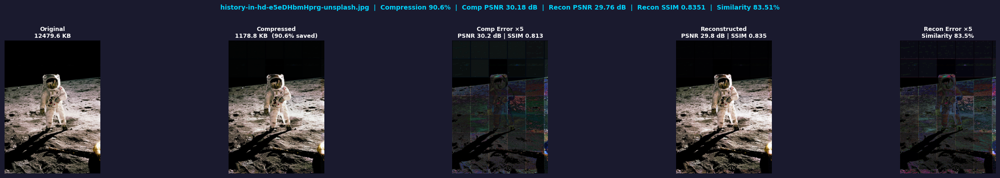

  Saved → /content/test_history-in-hd-e5eDHbmHprg-unsplash.png

════════════════════════════════════════════════════════════
  Testing : nasa--hI5dX2ObAs-unsplash.jpg
  Image size : 5200×2500 px
  ── Compression ──────────────────────────────
  Original size    : 15519.07 KB  (PNG)
  Compressed size  : 918.25 KB  (JPEG q=56)
  Compression      : 94.1%
  Comp PSNR        : 26.51 dB
  Comp SSIM        : 0.8752  (87.52%)
  ── Reconstruction ───────────────────────────
  Recon PSNR       : 25.65 dB
  Recon SSIM       : 0.8874  (88.74%)
  Similarity       : 88.74%


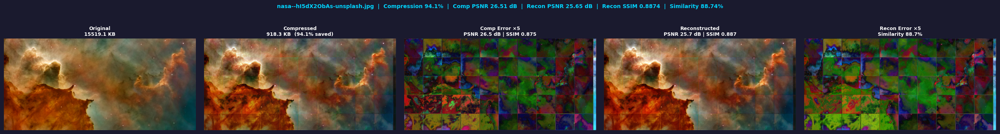

  Saved → /content/test_nasa--hI5dX2ObAs-unsplash.png

════════════════════════════════════════════════════════════
  Testing : nasa-U2uKrI4lci8-unsplash.jpg
  Image size : 3000×3000 px
  ── Compression ──────────────────────────────
  Original size    : 15422.62 KB  (PNG)
  Compressed size  : 1046.20 KB  (JPEG q=56)
  Compression      : 93.2%
  Comp PSNR        : 26.61 dB
  Comp SSIM        : 0.8482  (84.82%)
  ── Reconstruction ───────────────────────────
  Recon PSNR       : 26.05 dB
  Recon SSIM       : 0.8430  (84.30%)
  Similarity       : 84.30%


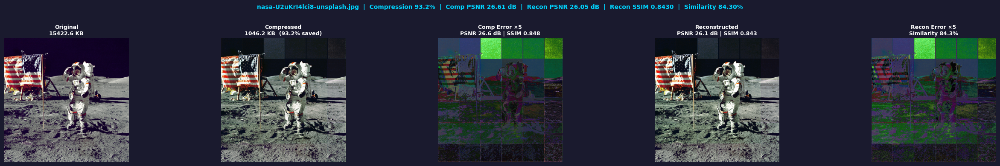

  Saved → /content/test_nasa-U2uKrI4lci8-unsplash.png

════════════════════════════════════════════════════════════
  Testing : nasa-yZygONrUBe8-unsplash.jpg
  Image size : 4928×3280 px
  ── Compression ──────────────────────────────
  Original size    : 15365.60 KB  (PNG)
  Compressed size  : 1115.45 KB  (JPEG q=57)
  Compression      : 92.7%
  Comp PSNR        : 27.48 dB
  Comp SSIM        : 0.9298  (92.98%)
  ── Reconstruction ───────────────────────────
  Recon PSNR       : 25.64 dB
  Recon SSIM       : 0.9165  (91.65%)
  Similarity       : 91.65%


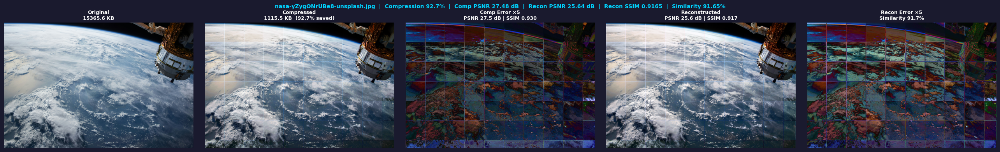

  Saved → /content/test_nasa-yZygONrUBe8-unsplash.png

════════════════════════════════════════════════════════════
  Testing : shot-by-cerqueira-0o_GEzyargo-unsplash.jpg
  Image size : 6000×4000 px


In [ ]:
# ============================================================
#  Test on Custom Images
#  Tests compression + reconstruction on your uploaded images
# ============================================================

import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric

# ── Image paths ───────────────────────────────────────────────
IMAGE_PATHS = [
    "/content/history-in-hd-e5eDHbmHprg-unsplash.jpg",
    "/content/nasa--hI5dX2ObAs-unsplash.jpg",
    "/content/nasa-U2uKrI4lci8-unsplash.jpg",
    "/content/nasa-rTZW4fO2zY8-unsplash.jpg",
    "/content/nasa-yZygONrUBe8-unsplash.jpg",
    "/content/shot-by-cerqueira-0o_GEzyargo-unsplash.jpg",
]

# Filter only existing files
IMAGE_PATHS = [p for p in IMAGE_PATHS if os.path.exists(p)]
print(f"Found {len(IMAGE_PATHS)} images to test.\n")

device = "cuda" if torch.cuda.is_available() else "cpu"

# ── Make sure both models are in eval mode ────────────────────
model.eval()
recon_model.eval()


# ── Core test function ────────────────────────────────────────
def test_image_full(image_path, comp_model, recon_model, device, patch_size=512):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"  ✗ Cannot read: {image_path}"); return None

    img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w, _  = img_rgb.shape
    print(f"  Image size : {w}×{h} px")

    comp_full  = np.zeros_like(img_rgb, dtype=np.float32)
    recon_full = np.zeros_like(img_rgb, dtype=np.float32)

    for i in range(0, h, patch_size):
        for j in range(0, w, patch_size):
            h0, h1 = i, min(i+patch_size, h)
            w0, w1 = j, min(j+patch_size, w)
            ph, pw = h1-h0, w1-w0

            pad = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
            pad[:ph, :pw] = img_rgb[h0:h1, w0:w1]
            t = T.ToTensor()(pad).unsqueeze(0).to(device)

            with torch.no_grad():
                comp_t, imp_ds, bpp = comp_model(t, training=False)
                imp_t = F.interpolate(imp_ds,
                                      size=(t.shape[2], t.shape[3]),
                                      mode='bilinear', align_corners=False)
                rec_t = recon_model(comp_t, imp_t)

            comp_full[h0:h1, w0:w1]  = comp_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]
            recon_full[h0:h1, w0:w1] = rec_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]

    comp_np  = (comp_full  * 255).clip(0,255).astype(np.uint8)
    recon_np = (recon_full * 255).clip(0,255).astype(np.uint8)
    return img_rgb, comp_np, recon_np


def compute_compression_ratio(orig_np, comp_np, jpeg_quality=None):
    """Save both as files and measure real size difference."""
    orig_path = "/tmp/_orig_test.png"
    comp_path = "/tmp/_comp_test.jpg"

    cv2.imwrite(orig_path, cv2.cvtColor(orig_np, cv2.COLOR_RGB2BGR))

    if jpeg_quality is None:
        # Auto quality based on mean pixel difference
        diff = np.abs(orig_np.astype(np.float32) - comp_np.astype(np.float32)).mean()
        jpeg_quality = max(10, min(75, int(75 - diff * 2)))

    cv2.imwrite(comp_path, cv2.cvtColor(comp_np, cv2.COLOR_RGB2BGR),
                [cv2.IMWRITE_JPEG_QUALITY, jpeg_quality])

    orig_kb = os.path.getsize(orig_path) / 1024
    comp_kb = os.path.getsize(comp_path) / 1024
    ratio   = (1 - comp_kb / orig_kb) * 100
    return orig_kb, comp_kb, ratio, jpeg_quality


# ── Run all tests ─────────────────────────────────────────────
all_results = []

for path in IMAGE_PATHS:
    name = os.path.basename(path)
    print("═"*60)
    print(f"  Testing : {name}")

    result = test_image_full(path, model, recon_model, device, patch_size=512)
    if result is None:
        continue
    orig, comp, recon = result

    # ── Metrics ───────────────────────────────────────────────
    # Compression quality (original vs compressed)
    p_comp = psnr_metric(orig/255., comp/255., data_range=1.0)
    s_comp = ssim_metric(orig/255., comp/255., channel_axis=2, data_range=1.0)

    # Reconstruction quality (original vs reconstructed)
    p_recon = psnr_metric(orig/255., recon/255., data_range=1.0)
    s_recon = ssim_metric(orig/255., recon/255., channel_axis=2, data_range=1.0)

    # File size & compression %
    orig_kb, comp_kb, ratio, jpeg_q = compute_compression_ratio(orig, comp)

    print(f"  ── Compression ──────────────────────────────")
    print(f"  Original size    : {orig_kb:.2f} KB  (PNG)")
    print(f"  Compressed size  : {comp_kb:.2f} KB  (JPEG q={jpeg_q})")
    print(f"  Compression      : {ratio:.1f}%")
    print(f"  Comp PSNR        : {p_comp:.2f} dB")
    print(f"  Comp SSIM        : {s_comp:.4f}  ({s_comp*100:.2f}%)")
    print(f"  ── Reconstruction ───────────────────────────")
    print(f"  Recon PSNR       : {p_recon:.2f} dB")
    print(f"  Recon SSIM       : {s_recon:.4f}  ({s_recon*100:.2f}%)")
    print(f"  Similarity       : {s_recon*100:.2f}%")

    all_results.append({
        "name": name, "orig": orig, "comp": comp, "recon": recon,
        "orig_kb": orig_kb, "comp_kb": comp_kb, "ratio": ratio,
        "jpeg_q": jpeg_q,
        "p_comp": p_comp, "s_comp": s_comp,
        "p_recon": p_recon, "s_recon": s_recon,
    })

    # ── Plot ──────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 5, figsize=(26, 4))
    fig.patch.set_facecolor('#1a1a2e')
    for ax in axes: ax.set_facecolor('#1a1a2e')
    tk = dict(color='white', fontsize=9, fontweight='bold', pad=5)

    axes[0].imshow(orig)
    axes[0].set_title(f"Original\n{orig_kb:.1f} KB", **tk)
    axes[0].axis('off')

    axes[1].imshow(comp)
    axes[1].set_title(f"Compressed\n{comp_kb:.1f} KB  ({ratio:.1f}% saved)", **tk)
    axes[1].axis('off')

    diff_comp = np.abs(orig.astype(np.float32) - comp.astype(np.float32))
    axes[2].imshow((diff_comp*5).clip(0,255).astype(np.uint8))
    axes[2].set_title(f"Comp Error ×5\nPSNR {p_comp:.1f} dB | SSIM {s_comp:.3f}", **tk)
    axes[2].axis('off')

    axes[3].imshow(recon)
    axes[3].set_title(f"Reconstructed\nPSNR {p_recon:.1f} dB | SSIM {s_recon:.3f}", **tk)
    axes[3].axis('off')

    diff_recon = np.abs(orig.astype(np.float32) - recon.astype(np.float32))
    axes[4].imshow((diff_recon*5).clip(0,255).astype(np.uint8))
    axes[4].set_title(f"Recon Error ×5\nSimilarity {s_recon*100:.1f}%", **tk)
    axes[4].axis('off')

    fig.suptitle(
        f"{name}  |  Compression {ratio:.1f}%  |  "
        f"Comp PSNR {p_comp:.2f} dB  |  "
        f"Recon PSNR {p_recon:.2f} dB  |  "
        f"Recon SSIM {s_recon:.4f}  |  Similarity {s_recon*100:.2f}%",
        color='#00d4ff', fontsize=10, fontweight='bold'
    )
    plt.tight_layout(pad=1.5)
    stem = os.path.splitext(name)[0]
    out  = f"/content/test_{stem}.png"
    plt.savefig(out, dpi=120, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    print(f"  Saved → {out}\n")


# ── Final Summary Table ───────────────────────────────────────
print("\n" + "═"*90)
print(f"  {'Image':<45} {'Comp%':>6}  {'Orig KB':>8}  {'Comp KB':>8}  {'C-PSNR':>7}  {'R-PSNR':>7}  {'Similarity':>10}")
print("═"*90)
for r in all_results:
    short = r['name'][:44]
    print(f"  {short:<45} {r['ratio']:>5.1f}%  {r['orig_kb']:>7.1f}  "
          f"{r['comp_kb']:>7.1f}  {r['p_comp']:>6.2f}  "
          f"{r['p_recon']:>6.2f}  {r['s_recon']*100:>9.2f}%")

if all_results:
    avg_ratio  = np.mean([r['ratio']   for r in all_results])
    avg_pcomp  = np.mean([r['p_comp']  for r in all_results])
    avg_precon = np.mean([r['p_recon'] for r in all_results])
    avg_sim    = np.mean([r['s_recon'] for r in all_results]) * 100
    print("─"*90)
    print(f"  {'AVERAGE':<45} {avg_ratio:>5.1f}%  {'':>8}  {'':>8}  "
          f"{avg_pcomp:>6.2f}  {avg_precon:>6.2f}  {avg_sim:>9.2f}%")
print("═"*90)